## Foursquare Places

La **API** de **Foursquare Places** nos permite retornar información de lugares, tiendas, restaurantes, museos...

Para poder usar la **API** vamos a necesitar tener un **`API_KEY`**, una llave única de 48 caracteres que nos va a permitir hacer llamadas y retornar información.

Para tener una **`API_KEY`** es necesario registrarse en la página de **Foursquare** como **desarrolladores** e iniciar un proyecto.

_**Foursquare Developers**_: https://developer.foursquare.com/


_**Documentación**_: https://developer.foursquare.com/reference/place-search


### Endpoints

En **Foursquare Places** tenemos diferentes endpoints, comenzaremos con **Search**:

```html
https://api.foursquare.com/v3/places/search
```
Este endpoint nos retorna información sobre lugares, como: ubicación, nombre, latitud y longitud, categoría, entre otras cosas.

Para hacer la búsqueda vamos a añadir los siguiente parámetros:
- **query** : **string**
    - A string to be matched against all content for this place, including but not limited to venue name, category, taste, and tips.


- **ll** : **string**
    - The latitude/longitude around which to retrieve place information. This must be specified as latitude,longitude (e.g., ll=41.8781,-87.6298).


- **radius** : **int32**
    - Defines the distance (in meters) within which to bias place results. The maximum allowed radius is 100,000 meters. Radius is used with ll or ip biased geolocation only.


- **categories** : **string**
    - Filters the response and returns FSQ Places matching the specified categories. Supports multiple Category IDs, separated by commas. For a complete list of Foursquare Category IDs, refer to the [Category Taxonomy](https://developer.foursquare.com/docs/categories) page.


- **chains** : **string**
    - Filters the response and returns FSQ Places matching the specified chains. Supports multiple chain IDs, separated by commas.


- **exclude_chains** : **string**
    - Filters the response and returns FSQ Places not matching any of the specified chains. Supports multiple chain IDs, separated by commas.


- **exclude_all_chains** : **boolean**
    - Filters the response by only returning FSQ Places that are not known to be part of any chain.


- **fields** : **string**
    - Indicate which fields to return in the response, separated by commas. If no fields are specified, all Core Fields are returned by default. For a complete list of returnable fields, refer to the [Response Fields](https://developer.foursquare.com/reference/response-fields) page.


- **min_price** : **int32**
    - Restricts results to only those places within the specified price range. Valid values range between 1 (most affordable) to 4 (most expensive), inclusive.


- **max_price** : **int32**
    - Restricts results to only those places within the specified price range. Valid values range between 1 (most affordable) to 4 (most expensive), inclusive.


- **open_at** : **string**
    - Support local day and local time requests through this parameter. To be specified as DOWTHHMM (e.g., 1T2130), where DOW is the day number 1-7 (Monday = 1, Sunday = 7) and time is in 24 hour format. Places that do not have opening hours will not be returned if this parameter is specified.


- **open_now** : **boolean**
    - Restricts results to only those places that are open now. Places that do not have opening hours will not be returned if this parameter is specified.


- **ne** : **string**
    - The latitude/longitude representing the north/east points of a rectangle. Must be used with sw parameter to specify a rectangular search box.


- **sw** : **string**
    - The latitude/longitude representing the south/west points of a rectangle. Must be used with ne parameter to specify a rectangular search box.


- **near** : **string**
    - A string naming a locality in the world (e.g., "Chicago, IL"). If the value is not geocodable, returns an error.


- **sort** : **string**
    - Specifies the order in which results are listed. Possible values are:

        - relevance (default)
        - rating
        - distance


- **limit** : **int32**
    - The number of results to return, up to 50. Defaults to 10.


- **session_token** : **string**
    - A user-generated token to identify a session for billing purposes. Learn more about session tokens.

In [1]:
import numpy as np
import pandas as pd

import requests
from pprint import pprint

In [2]:
# Credenciales

CLIENT_ID = ""

CLIENT_SECRET = ""

API_KEY = "="

In [5]:
# Llamada al API

# Base del Endpoint
search_url = "https://api.foursquare.com/v3/places/search"

# Parametros
query = "coffee"

near = "sol, madrid"

# Endpoint
endpoint = f"{search_url}?query={query}&near={near}&limit=50"

print(f"Endpoint: {endpoint}")

# Headers
# Para poder usar el API tenemos que autenticarnos usando el "API_KEY"
# Por eso debemos crear una nueva variable "headers"
# Este diccionario tendrá la información de los permisos necesarios.

headers = {"accept"        : "application/json", 
           "Authorization" : API_KEY}

headers

# Request
# Agregamos el parámetro "headers"
response = requests.get(url = endpoint, headers = headers)

print(f"response: {response.status_code}")

print(response.json())

Endpoint: https://api.foursquare.com/v3/places/search?query=coffee&near=sol, madrid&limit=50
response: 200
{'results': [{'fsq_id': '519681f9498e614af99d523a', 'categories': [{'id': 13035, 'name': 'Coffee Shop', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/coffeeshop_', 'suffix': '.png'}}], 'chains': [{'id': 'ab4c54c0-d68a-012e-5619-003048cad9da', 'name': 'Starbucks'}], 'distance': 24, 'geocodes': {'main': {'latitude': 40.417489, 'longitude': -3.704665}}, 'link': '/v3/places/519681f9498e614af99d523a', 'location': {'address': 'Calle Preciados, 3', 'address_extended': 'C. Preciados, 3', 'admin_region': 'Comunidad de Madrid', 'country': 'ES', 'cross_street': 'C. Preciados, 3', 'formatted_address': 'Calle Preciados, 3 (C. Preciados, 3), 28013 Madrid Madrid', 'locality': 'Madrid', 'postcode': '28013', 'region': 'Madrid'}, 'name': 'Starbucks', 'related_places': {}, 'timezone': 'Europe/Madrid'}, {'fsq_id': '5d2b5bda53331f002344bbad', 'categories': [{'id': 13035, 'name': 'Cof

In [25]:
# Usando pprint

pprint(response.json()["results"][3])

{'categories': [{'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/default_',
                          'suffix': '.png'},
                 'id': 13065,
                 'name': 'Restaurant'}],
 'chains': [],
 'distance': 54,
 'fsq_id': '4c124bbea5eb76b021ddbdb7',
 'geocodes': {'drop_off': {'latitude': 40.417656, 'longitude': -3.703765},
              'main': {'latitude': 40.417601, 'longitude': -3.703804},
              'roof': {'latitude': 40.417601, 'longitude': -3.703804}},
 'link': '/v3/places/4c124bbea5eb76b021ddbdb7',
 'location': {'address': 'Calle del Carmen, 3',
              'address_extended': 'Bajo;Local',
              'admin_region': 'Comunidad de Madrid',
              'country': 'ES',
              'formatted_address': 'Calle del Carmen, 3, 28013 Madrid Madrid',
              'locality': 'Madrid',
              'postcode': '28013',
              'region': 'Madrid'},
 'name': 'Cafetería Armenia',
 'related_places': {},
 'timezone': 'Europe/Madrid'}


In [23]:
pprint(response.json())

{'context': {'geo_bounds': {'circle': {'center': {'latitude': 40.417363,
                                                  'longitude': -3.704432},
                                       'radius': 413}}},
 'results': [{'categories': [{'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/coffeeshop_',
                                       'suffix': '.png'},
                              'id': 13035,
                              'name': 'Coffee Shop'}],
              'chains': [{'id': 'ab4c54c0-d68a-012e-5619-003048cad9da',
                          'name': 'Starbucks'}],
              'distance': 24,
              'fsq_id': '519681f9498e614af99d523a',
              'geocodes': {'main': {'latitude': 40.417489,
                                    'longitude': -3.704665}},
              'link': '/v3/places/519681f9498e614af99d523a',
              'location': {'address': 'Calle Preciados, 3',
                           'address_extended': 'C. Preciados, 3',
                    

                              'name': 'Restaurant'}],
              'chains': [],
              'distance': 262,
              'fsq_id': '4da317ba9935a093bfd0c16f',
              'geocodes': {'drop_off': {'latitude': 40.41512,
                                        'longitude': -3.705559},
                           'main': {'latitude': 40.415192,
                                    'longitude': -3.705814},
                           'roof': {'latitude': 40.415192,
                                    'longitude': -3.705814}},
              'link': '/v3/places/4da317ba9935a093bfd0c16f',
              'location': {'address': 'Plaza Santa Cruz, 5',
                           'admin_region': 'Comunidad de Madrid',
                           'country': 'ES',
                           'cross_street': '',
                           'formatted_address': 'Plaza Santa Cruz, 5, 28012 '
                                                'Madrid Madrid',
                           'locality': 'Madri

In [24]:
# Por defecto, Foursquare nos retorna los primero 50 resultados

len(response.json()["results"])

50

In [31]:
# Usando "url_params"

search_url = "https://api.foursquare.com/v3/places/search"

# "url_params" es un diccionario que tendrá todos los parámetros de nuestra búsqueda
# Nos ayuda a tener el código más limpio y es fácil de utilizar al momento de hacer la llamada a la API.

url_params = {"query"    : "museum",
              "ll"       : "40.4167,-3.7042",
              "open_now" : None,
              "limit"    : 50,
              "radius"   : 10_000,
              "category" : None}

headers = {"accept"       : "application/json", 
           "Authorization": API_KEY}

# Como ahora usamos una variable para los parámetros, debemos agregarlos con el parámetro "params"
response = requests.get(url = search_url, params = url_params, headers = headers)

# El método ".get()" le dará el formato a el endpoint usando los "key : value" del diccionario "url_params"
print(f"endpoint: {response.url}")

print(f"response: {response.status_code}")

print(response.json())

endpoint: https://api.foursquare.com/v3/places/search?query=museum&ll=40.4167%2C-3.7042&limit=50&radius=10000
response: 200
{'results': [{'fsq_id': '4ed8bfa646907c1b40950ccf', 'categories': [{'id': 10030, 'name': 'History Museum', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/arts_entertainment/museum_history_', 'suffix': '.png'}}], 'chains': [], 'distance': 353, 'geocodes': {'main': {'latitude': 40.413832, 'longitude': -3.705469}, 'roof': {'latitude': 40.413832, 'longitude': -3.705469}}, 'link': '/v3/places/4ed8bfa646907c1b40950ccf', 'location': {'address': 'Calle Concepción Jerónima, 15', 'admin_region': 'Comunidad de Madrid', 'country': 'ES', 'cross_street': '', 'formatted_address': 'Calle Concepción Jerónima, 15, 28012 Madrid Madrid', 'locality': 'Madrid', 'postcode': '28012', 'region': 'Madrid'}, 'name': 'Imprenta Municipal', 'related_places': {}, 'timezone': 'Europe/Madrid'}, {'fsq_id': '4adcda38f964a520943c21e3', 'categories': [{'id': 10027, 'name': 'Museum', 'icon'

In [32]:
pprint(response.json())

{'context': {'geo_bounds': {'circle': {'center': {'latitude': 40.4167,
                                                  'longitude': -3.7042},
                                       'radius': 10000}}},
 'results': [{'categories': [{'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/arts_entertainment/museum_history_',
                                       'suffix': '.png'},
                              'id': 10030,
                              'name': 'History Museum'}],
              'chains': [],
              'distance': 353,
              'fsq_id': '4ed8bfa646907c1b40950ccf',
              'geocodes': {'main': {'latitude': 40.413832,
                                    'longitude': -3.705469},
                           'roof': {'latitude': 40.413832,
                                    'longitude': -3.705469}},
              'link': '/v3/places/4ed8bfa646907c1b40950ccf',
              'location': {'address': 'Calle Concepción Jerónima, 15',
                           '

              'name': 'Velázquez Tech Museum',
              'related_places': {},
              'timezone': 'Europe/Madrid'},
             {'categories': [{'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/arts_entertainment/museum_',
                                       'suffix': '.png'},
                              'id': 10027,
                              'name': 'Museum'}],
              'chains': [],
              'distance': 793,
              'fsq_id': '583178471e1de5120b161fc7',
              'geocodes': {'drop_off': {'latitude': 40.415715,
                                        'longitude': -3.713521},
                           'main': {'latitude': 40.415737,
                                    'longitude': -3.713776},
                           'roof': {'latitude': 40.415737,
                                    'longitude': -3.713776}},
              'link': '/v3/places/583178471e1de5120b161fc7',
              'location': {'address': 'Plaza de la Almudena, s/

                           'admin_region': 'Comunidad de Madrid',
                           'country': 'ES',
                           'formatted_address': 'Jovellanos, 5, 28014 Madrid '
                                                'Madrid',
                           'locality': 'Madrid',
                           'postcode': '28014',
                           'region': 'Madrid'},
              'name': 'Casa de Canarias',
              'related_places': {},
              'timezone': 'Europe/Madrid'},
             {'categories': [{'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/arts_entertainment/museum_',
                                       'suffix': '.png'},
                              'id': 10027,
                              'name': 'Museum'}],
              'chains': [],
              'distance': 2906,
              'fsq_id': '4cefece128abb60cf959c509',
              'geocodes': {'drop_off': {'latitude': 40.403906,
                                        'l

In [51]:
response.json()["results"][0].get("fsq_idqwerghjk")

Ya con la información en una variable, podemos darle formato de **DataFrame**.

In [46]:
data = response.json()

data_df = list()

for r in data["results"]:

    fsq_id = r["fsq_id"]
    category = r["categories"][0]["name"]
    latitude = r["geocodes"]["main"]["latitude"]
    longitude = r["geocodes"]["main"]["longitude"]
    location = r["location"]["formatted_address"]
    postcode = r["location"].get("postcode")
    name = r["name"]
    
    data_df.append([name, category, latitude, longitude, location, postcode, fsq_id])
    
df = pd.DataFrame(data = data_df, columns = ["name", "category", "latitude", "longitude", "location", "postcode", "fsq_id"])

df

,name,category,latitude,longitude,location,postcode,fsq_id
0,Imprenta Municipal,History Museum,40.413832,-3.705469,"Calle Concepción Jerónima, 15, 28012 Madrid Ma...",28012,4ed8bfa646907c1b40950ccf
1,Real Academia de Bellas Artes de San Fernando,Museum,40.417712,-3.700618,"Calle de Alcalá 13, 28014 Madrid Madrid",28014,4adcda38f964a520943c21e3
2,Espacio Fundación Telefónica,Art Museum,40.420323,-3.701662,"Calle Fuencarral, 3, 28004 Madrid Madrid",28004,4b790f5af964a5205fea2ee3
3,Casa-Museo de Lope de Vega,History Museum,40.414417,-3.697414,"Calle de Cervantes, 11, 28014 Madrid Madrid",28014,4adcda37f964a5200f3c21e3
4,Museo Thyssen Bornemisza (Museo Thyssen-Bornem...,Museum,40.416005,-3.694984,"Paseo del Prado, 8, 28014 Madrid Madrid",28014,4adcda37f964a5200d3c21e3
5,Museo Naval,Museum,40.417518,-3.692662,"Paseo del Prado, 5, 28014 Madrid Madrid",28014,4adcda39f964a5209e3c21e3
6,Museo Nacional del Prado,Museum,40.413733,-3.692420,"Calle Ruiz de Alarcón, 23 (P. del Prado), 2801...",28014,4adcda37f964a520fd3b21e3
7,CaixaForum Madrid,Museum,40.411052,-3.693474,"Paseo del Prado, 36, 28014 Madrid Madrid",28014,4b0015c0f964a520b43a22e3
8,Museo Nacional del Romanticismo (Madrid),History Museum,40.425917,-3.698768,"Calle San Mateo, 13, 28004 Madrid Madrid",28004,4c62ceed79d1e21e7ef5d615
9,Real Armería de Madrid,Museum,40.416539,-3.713515,"Calle Bailén, 6, 28013 Madrid Madrid",28013,4f1d6558e4b0b4fdeb43570d


Ahora, podemos mostrar toda esta información en un mapa de **Folium**.

In [54]:
import folium

sol_ll = (40.4167, -3.7042)

sol_map = folium.Map(location = sol_ll, zoom_start = 13)

museums = folium.map.FeatureGroup()

for lat, lng, name, category in zip(df["latitude"], df["longitude"], df["name"], df["category"]):
    
    museums.add_child(folium.Marker(location = [lat, lng],
                                    popup    = f"{name}, {category}"))
    
sol_map.add_child(museums)

sol_map

### Endpoints

**Details**: Retorna información de un lugar, utilizando su **`fsq_id`**:

```html
https://api.foursquare.com/v3/places/{fsq_id}
```
_**Documentación**_: https://developer.foursquare.com/reference/place-details

No tiene parámetros, las llamadas las hacemos usando directamente el **`fsq_id`**.

La información que retorna es la misma que la retornada por **Search**, solo que es la información de un único lugar. 

In [55]:
fsq_id = "4eda06cf775bcc53fa120bd4"

details_url = f"https://api.foursquare.com/v3/places/{fsq_id}"

headers = {"accept": "application/json", 
           "Authorization": API_KEY}

response = requests.get(url = details_url, headers = headers)

print(f"endpoint: {response.url}")

print(f"response: {response.status_code}")

print(response.json())

endpoint: https://api.foursquare.com/v3/places/4eda06cf775bcc53fa120bd4
response: 200
{'fsq_id': '4eda06cf775bcc53fa120bd4', 'categories': [{'id': 10030, 'name': 'History Museum', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/arts_entertainment/museum_history_', 'suffix': '.png'}}], 'chains': [], 'geocodes': {'main': {'latitude': 40.42332, 'longitude': -3.689144}, 'roof': {'latitude': 40.42332, 'longitude': -3.689144}}, 'link': '/v3/places/4eda06cf775bcc53fa120bd4', 'location': {'address': 'Calle de Serrano, 13', 'admin_region': 'Comunidad de Madrid', 'country': 'ES', 'cross_street': '', 'formatted_address': 'Calle de Serrano, 13, 28001 Madrid Madrid', 'locality': 'Madrid', 'postcode': '28001', 'region': 'Madrid'}, 'name': 'Museo Arqueológico Nacional', 'related_places': {'children': []}, 'timezone': 'Europe/Madrid'}


### Endpoints

**Photos**: Retorna imágenes de un lugar, utilizando su **`fsq_id`**:

```html

https://api.foursquare.com/v3/places/{fsq_id}/photos
```

_**Documentación**_: https://developer.foursquare.com/reference/place-photos

Tiene 3 parámetros para ordenar y filtrar los resultados:

- **limit : int32**
    - The specified number of photos per page. Returns 10 photos by default, up to a maximum number of 50.


- **sort : string**
    - Specifies the order in which results are listed. Possible values are:

        - popular (default) - sorts results based on their popularity among Foursquare users
        - newest - sorts results from most recently added to least recently added


- **classifications : string**
    - Restricts the results to photos matching the specified classifications, separated by a comma. Possible values are:

        - food - photos of food
        - indoor - photos of indoors
        - menu - photos of menus
        - outdoor - photos of storefronts, outdoors, and exteriors
        
        
_**Para manipular las imágenes de Foursquare**_: https://developer.foursquare.com/reference/places-photos-guide#assembling-a-photo-url

In [56]:
fsq_id = "4eda06cf775bcc53fa120bd4"

url_params = {"limit"           : 50,
              "sort"            : "newest",
              "classifications" : None} 

details_url = f"https://api.foursquare.com/v3/places/{fsq_id}/photos"

headers = {"accept": "application/json", 
           "Authorization": API_KEY}

response = requests.get(url = details_url, params = url_params, headers = headers)

print(f"endpoint: {response.url}")

print(f"response: {response.status_code}")

print(response.json())

endpoint: https://api.foursquare.com/v3/places/4eda06cf775bcc53fa120bd4/photos?limit=50&sort=newest
response: 200
[{'id': '63f76dc676ee744df5c7e4bb', 'created_at': '2023-02-23T13:44:38.000Z', 'prefix': 'https://fastly.4sqi.net/img/general/', 'suffix': '/73713187_LyVtHJfoDDE2QvGw1etLG85XD8f64LZE9jFM-OvgiUU.jpg', 'width': 1440, 'height': 1920}, {'id': '63f76dbacae2ac2518c8f4cd', 'created_at': '2023-02-23T13:44:26.000Z', 'prefix': 'https://fastly.4sqi.net/img/general/', 'suffix': '/73713187_Qnq7qB8V7X62hYUMofOGm59wYbaccoWXzBBRHHBXhi8.jpg', 'width': 1440, 'height': 1920}, {'id': '63c832e8c59c3a50600685bb', 'created_at': '2023-01-18T17:56:56.000Z', 'prefix': 'https://fastly.4sqi.net/img/general/', 'suffix': '/42000618_U1N8nIzTIB7NhEAwN6UCBZMFPD8pF2miNi4iSg3RfS8.jpg', 'width': 1920, 'height': 1440}, {'id': '63bc17d94ace1055963af53a', 'created_at': '2023-01-09T13:34:17.000Z', 'prefix': 'https://fastly.4sqi.net/img/general/', 'suffix': '/2512505_Iw4owi6oSrjijT_wYcOUTkJtEHZWZ-Z1vaUQNIG31gg.jpg'

In [58]:
response.json()

[{'id': '63f76dc676ee744df5c7e4bb',
  'created_at': '2023-02-23T13:44:38.000Z',
  'prefix': 'https://fastly.4sqi.net/img/general/',
  'suffix': '/73713187_LyVtHJfoDDE2QvGw1etLG85XD8f64LZE9jFM-OvgiUU.jpg',
  'width': 1440,
  'height': 1920},
 {'id': '63f76dbacae2ac2518c8f4cd',
  'created_at': '2023-02-23T13:44:26.000Z',
  'prefix': 'https://fastly.4sqi.net/img/general/',
  'suffix': '/73713187_Qnq7qB8V7X62hYUMofOGm59wYbaccoWXzBBRHHBXhi8.jpg',
  'width': 1440,
  'height': 1920},
 {'id': '63c832e8c59c3a50600685bb',
  'created_at': '2023-01-18T17:56:56.000Z',
  'prefix': 'https://fastly.4sqi.net/img/general/',
  'suffix': '/42000618_U1N8nIzTIB7NhEAwN6UCBZMFPD8pF2miNi4iSg3RfS8.jpg',
  'width': 1920,
  'height': 1440},
 {'id': '63bc17d94ace1055963af53a',
  'created_at': '2023-01-09T13:34:17.000Z',
  'prefix': 'https://fastly.4sqi.net/img/general/',
  'suffix': '/2512505_Iw4owi6oSrjijT_wYcOUTkJtEHZWZ-Z1vaUQNIG31gg.jpg',
  'width': 1080,
  'height': 608},
 {'id': '63a8c85450bbb833132232f4',
  

In [70]:
data = response.json()

image_data = list()

for r in data:
    image_id = r["id"]
    created_at = r["created_at"]
    prefix = r["prefix"] + "original" # Hay que agregar "original" al url para poder visualizarlo.
    suffix = r["suffix"]
    
    image_data.append([image_id, prefix + suffix, created_at])
    
df_image = pd.DataFrame(data = image_data, columns = ["id", "image_url", "created_at"])

df_image

,id,image_url,created_at
0,63f76dc676ee744df5c7e4bb,https://fastly.4sqi.net/img/general/original/7...,2023-02-23T13:44:38.000Z
1,63f76dbacae2ac2518c8f4cd,https://fastly.4sqi.net/img/general/original/7...,2023-02-23T13:44:26.000Z
2,63c832e8c59c3a50600685bb,https://fastly.4sqi.net/img/general/original/4...,2023-01-18T17:56:56.000Z
3,63bc17d94ace1055963af53a,https://fastly.4sqi.net/img/general/original/2...,2023-01-09T13:34:17.000Z
4,63a8c85450bbb833132232f4,https://fastly.4sqi.net/img/general/original/5...,2022-12-25T22:01:56.000Z
5,638b4f95dd03ab30ae44aafb,https://fastly.4sqi.net/img/general/original/4...,2022-12-03T13:31:01.000Z
6,63481c6c4beabb0237bbe3a2,https://fastly.4sqi.net/img/general/original/1...,2022-10-13T14:10:52.000Z
7,63481c6ab9b631432b5f9b72,https://fastly.4sqi.net/img/general/original/1...,2022-10-13T14:10:50.000Z
8,63481c69456e946e3a74e314,https://fastly.4sqi.net/img/general/original/1...,2022-10-13T14:10:49.000Z
9,63481c6752b01f1436c91ce2,https://fastly.4sqi.net/img/general/original/1...,2022-10-13T14:10:47.000Z


In [68]:
for url in df_image["image_url"]:
    print(url)

https://fastly.4sqi.net/img/general/800x600/73713187_LyVtHJfoDDE2QvGw1etLG85XD8f64LZE9jFM-OvgiUU.jpg
https://fastly.4sqi.net/img/general/800x600/73713187_Qnq7qB8V7X62hYUMofOGm59wYbaccoWXzBBRHHBXhi8.jpg
https://fastly.4sqi.net/img/general/800x600/42000618_U1N8nIzTIB7NhEAwN6UCBZMFPD8pF2miNi4iSg3RfS8.jpg
https://fastly.4sqi.net/img/general/800x600/2512505_Iw4owi6oSrjijT_wYcOUTkJtEHZWZ-Z1vaUQNIG31gg.jpg
https://fastly.4sqi.net/img/general/800x600/586180156_e_oT638h_Wo8YL2erZ1NALF1oIObsd4YZ1z1H-wbd3s.jpg
https://fastly.4sqi.net/img/general/800x600/49859_rI1oO-1ShonA_p54AJDgWEud7g-46uIae52mtz8vhZQ.jpg
https://fastly.4sqi.net/img/general/800x600/1379741067_p3SR7sw16RzExCdLAoFs-ZxrWZORiakpWVh3zkulqMM.jpg
https://fastly.4sqi.net/img/general/800x600/1379741067_YZxBk1E51j6TtOuN8TtYWiZSA6_QmA0OiAsOT3X-RzE.jpg
https://fastly.4sqi.net/img/general/800x600/1379741067_E6r_b4tWeOVHM9XkLIPctT0Nj7-1wkFKQAelYNrZldA.jpg
https://fastly.4sqi.net/img/general/800x600/1379741067_PMp3edEJ-f9NB4NH9s5K1FMHuKBY_Qti1

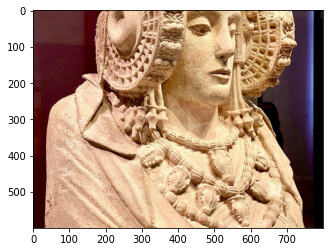

https://fastly.4sqi.net/img/general/800x600/73713187_LyVtHJfoDDE2QvGw1etLG85XD8f64LZE9jFM-OvgiUU.jpg


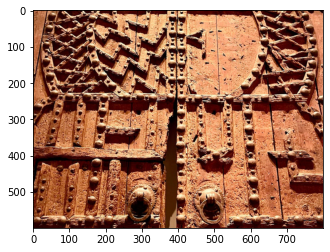

https://fastly.4sqi.net/img/general/800x600/73713187_Qnq7qB8V7X62hYUMofOGm59wYbaccoWXzBBRHHBXhi8.jpg


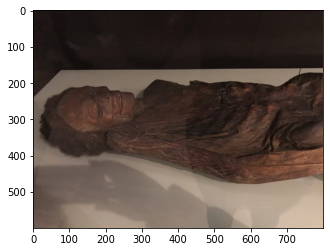

https://fastly.4sqi.net/img/general/800x600/42000618_U1N8nIzTIB7NhEAwN6UCBZMFPD8pF2miNi4iSg3RfS8.jpg


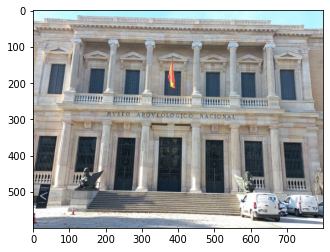

https://fastly.4sqi.net/img/general/800x600/2512505_Iw4owi6oSrjijT_wYcOUTkJtEHZWZ-Z1vaUQNIG31gg.jpg


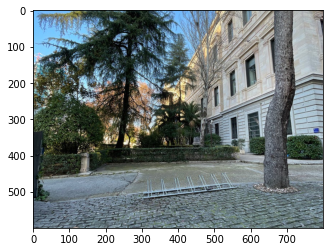

https://fastly.4sqi.net/img/general/800x600/586180156_e_oT638h_Wo8YL2erZ1NALF1oIObsd4YZ1z1H-wbd3s.jpg


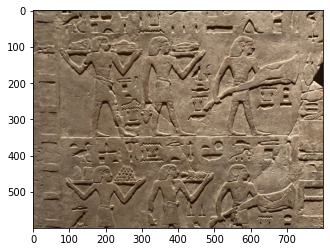

https://fastly.4sqi.net/img/general/800x600/49859_rI1oO-1ShonA_p54AJDgWEud7g-46uIae52mtz8vhZQ.jpg


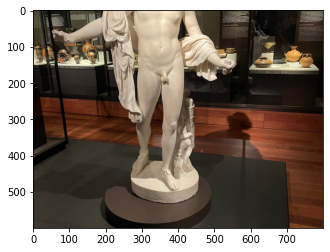

https://fastly.4sqi.net/img/general/800x600/1379741067_p3SR7sw16RzExCdLAoFs-ZxrWZORiakpWVh3zkulqMM.jpg


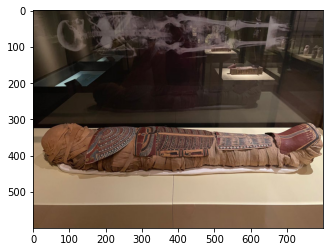

https://fastly.4sqi.net/img/general/800x600/1379741067_YZxBk1E51j6TtOuN8TtYWiZSA6_QmA0OiAsOT3X-RzE.jpg


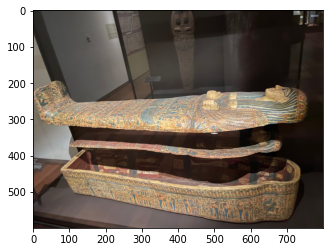

https://fastly.4sqi.net/img/general/800x600/1379741067_E6r_b4tWeOVHM9XkLIPctT0Nj7-1wkFKQAelYNrZldA.jpg


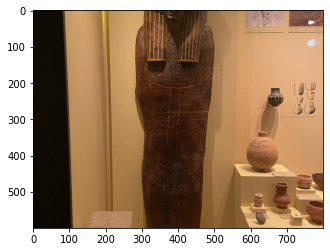

https://fastly.4sqi.net/img/general/800x600/1379741067_PMp3edEJ-f9NB4NH9s5K1FMHuKBY_Qti1lySFh54XTo.jpg


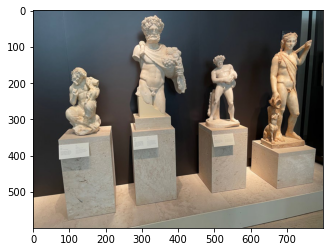

https://fastly.4sqi.net/img/general/800x600/1379741067_EmE_n2BXO1SAmumRl0bapLNjsjogiAhGb1heJDCFKYs.jpg


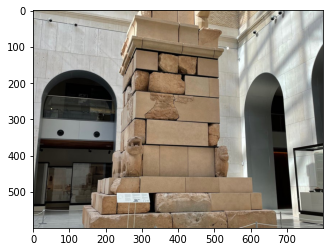

https://fastly.4sqi.net/img/general/800x600/1379741067_Un-QZ8ZhTIc0gM53lOILbQaPfuL2IFHnpDEvFNGAmRk.jpg


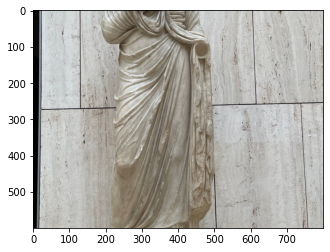

https://fastly.4sqi.net/img/general/800x600/24452938_I0cLp1qk5V2DkDTdpKurjZBcXrUQWs2W828KqLKIVYg.jpg


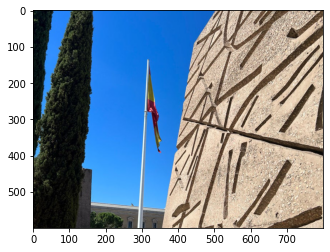

https://fastly.4sqi.net/img/general/800x600/1361160329_U8KM8_2fc3fyAezFz4Tmyx5hgftJW83GkDcMqA21NR0.jpg


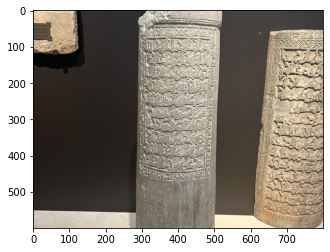

https://fastly.4sqi.net/img/general/800x600/1361160329_jLNoqGKBJ1gwjnwbbDUMR0LGwMvt1NiHibxbKiIIHjM.jpg


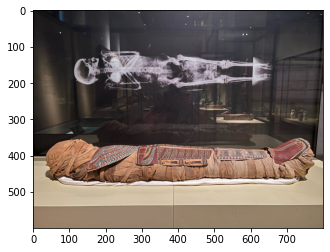

https://fastly.4sqi.net/img/general/800x600/1361160329_hNmolpiQqgjQzPZiQhQ7hTMfj55Q8JoZ1NoGjOL9uQc.jpg


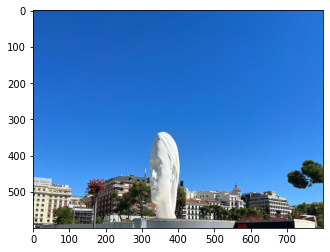

https://fastly.4sqi.net/img/general/800x600/1361160329_N4jowo1zQOQEip2qPrhlb0W7V6wWSo4Q5PlrW4Ci7mk.jpg


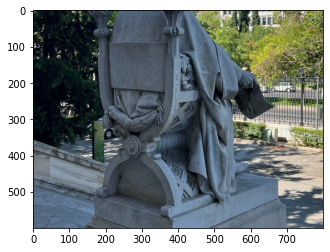

https://fastly.4sqi.net/img/general/800x600/1361160329_jopMjhe42DqXrmYfycD7IHKkOYVE0RNl0Tm1ShRxubk.jpg


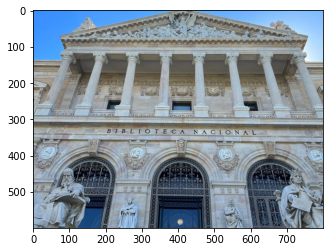

https://fastly.4sqi.net/img/general/800x600/1361160329_nLbdxBNdGC6ogdBigxDBVpRz-0l07LN8Wdz_sl8EAsQ.jpg


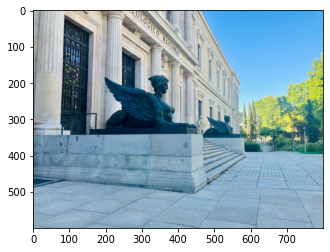

https://fastly.4sqi.net/img/general/800x600/27305793_FetOhSx55hktebIqvSsV0nyhGUeM2xBnZbObW0aPC54.jpg


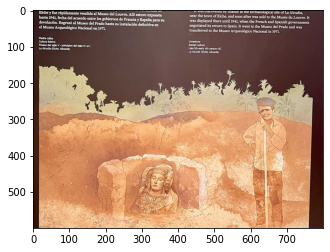

https://fastly.4sqi.net/img/general/800x600/73713187_HFOPgToguJZtpQb9u8w4MyvthAdUr1fkw_Zkm7hRn-M.jpg


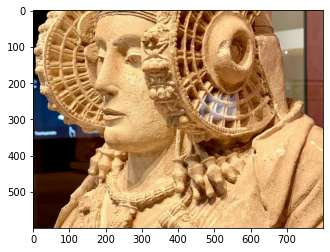

https://fastly.4sqi.net/img/general/800x600/73713187_n3KgBc8jIGHtKYYOnkdcqAdJypvSLFwyMJGypobADCc.jpg


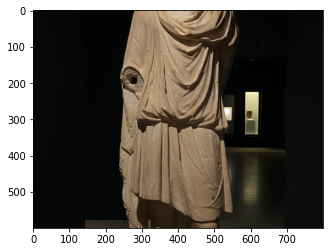

https://fastly.4sqi.net/img/general/800x600/477474548_jFldqr4UwHaUTAebpXIj7qQ2qH_8t5yNizHeo0Fnix0.jpg


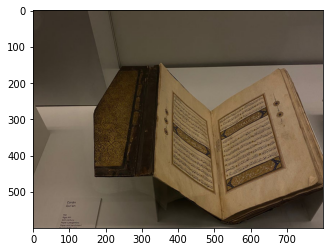

https://fastly.4sqi.net/img/general/800x600/477474548_XO_z8Q2nWhGfq_XjaWxvn_t59rBMarvcJJqR6obQpVA.jpg


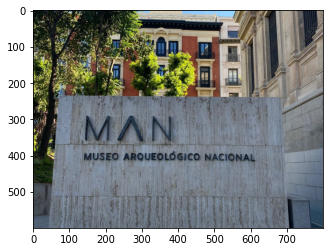

https://fastly.4sqi.net/img/general/800x600/477474548_9IF8Q7DF-rCBKrCq27flQM-zqvnY7PcrVHZ43nl1yHE.jpg


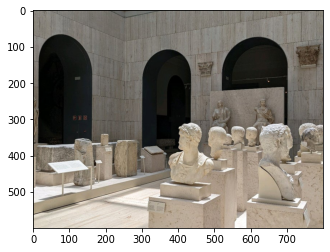

https://fastly.4sqi.net/img/general/800x600/271126_HAfa1jqE3GiZlcKIEVeuqDMibWvnfk87XwOeT7qIPcQ.jpg


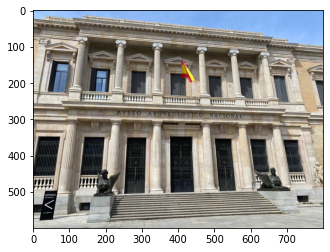

https://fastly.4sqi.net/img/general/800x600/1040451_aN8nDQQS11rIOKvqJpxnG5IDoW5IhuEj4GjGDvjxa8M.jpg


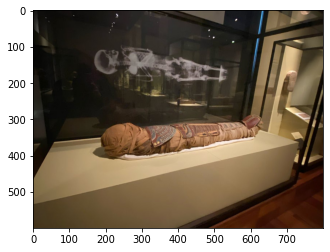

https://fastly.4sqi.net/img/general/800x600/13910463_bkzZaUyVLZXn6AGP2iLNQaMDDRHSrLMM_egSmWx-9j4.jpg


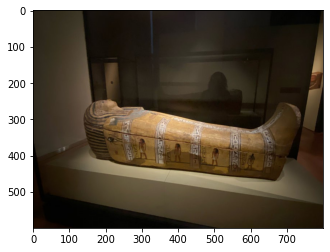

https://fastly.4sqi.net/img/general/800x600/13910463_iR6U2EUQy7xtvBUjFkPf1T1H-blbpJjImnk4IXkUeaE.jpg


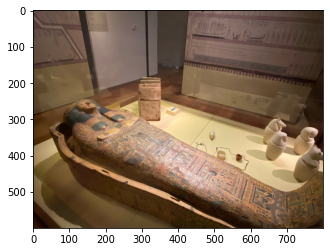

https://fastly.4sqi.net/img/general/800x600/13910463_X9YTvhAkTHz2WiAtllYjJztwLm69-FMu6ceaiB33ajM.jpg


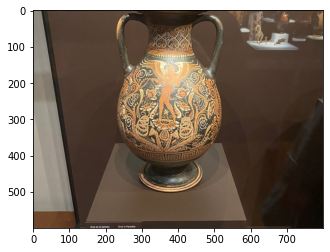

https://fastly.4sqi.net/img/general/800x600/13910463_wyb1TAToCIpSIpKL1_i3HAgm9NtlYqCgaVlpwi1Njho.jpg


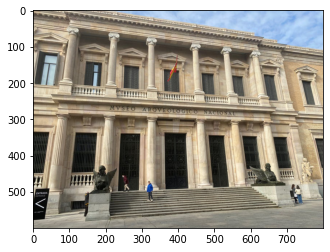

https://fastly.4sqi.net/img/general/800x600/13910463_HBE5WtujZUBAuMf0fB4PhOORuj3Tg6o0u5wSaxy-dQg.jpg


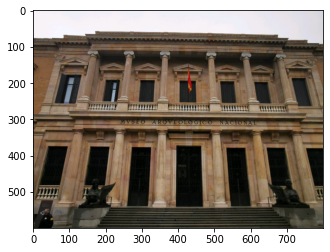

https://fastly.4sqi.net/img/general/800x600/56869506_p1zztXpsOcTE7un2KyPL2Lxtd-Ab-HuRXLVWwfkd7Ig.jpg


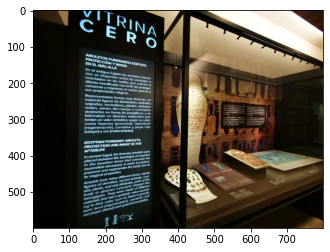

https://fastly.4sqi.net/img/general/800x600/56869506_yAVRoUX4C1_u6NY-thr2Je-G407etc4MFMdxiiDcCsk.jpg


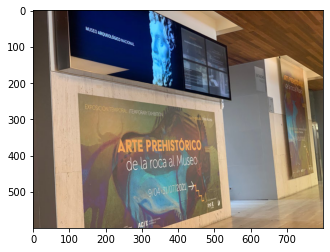

https://fastly.4sqi.net/img/general/800x600/458701_g_h7eqr7VdBqgB53hhnC2PCCn-NtcnTZtuDTuvN1lGM.jpg


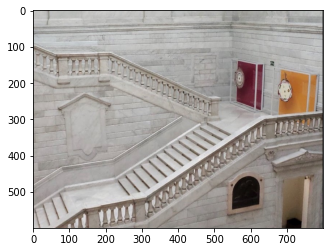

https://fastly.4sqi.net/img/general/800x600/571284939_zNKFtcvh-Eh0HM5XC6-rwD7ItxL0l3_II8ZLhmIHvPY.jpg


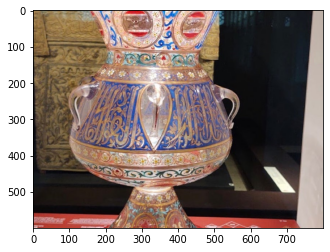

https://fastly.4sqi.net/img/general/800x600/571284939_rje_ZodQgaH7hah-e0hbauqXVyuSerlMchulVGganCE.jpg


In [69]:
import urllib
import matplotlib.pyplot as plt

for url in df_image["image_url"]:
    
    f = urllib.request.urlopen(url)

    a = plt.imread(f, format = f".{url.split('.')[-1]}")
    plt.imshow(a)
    plt.show()
    
    print(url)

### Endpoints

**Tips**: Retorna "tips" o reseñas de un lugar dejados por lo usuarios, utilizando su **`fsq_id`**:

```html
https://api.foursquare.com/v3/places/{fsq_id}/tips
```
_**Documentación**_: https://developer.foursquare.com/reference/place-tips

Tiene 3 parámetros para controlar la información que retornamos:
- **limit : int32**
    - The specified number of tips per page. Returns 10 tips by default, up to a maximum number of 50.


- **fields : string**
    - Indicate which fields to return in the response, separated by commas. Supported fields are:

        - id - the ID of the tip
        - created_at - when was the tip created
        - text - what does the tip actually say?
        - lang - what language was the tip created in
        
    Default fields if this param is omitted are "id", "created_at", and "text".


- **sort : string**
    - Specifies the order in which results are listed. Possible values are:

        - popular (default) - sorts results based on their popularity among Foursquare users
        - newest - sorts results from most recently added to least recently added

In [71]:
fsq_id = "4eda06cf775bcc53fa120bd4"

url_params = {"limit"  : 50,
              "fields" : "id,created_at,text,lang",
              "sort"   : "newest"} 

details_url = f"https://api.foursquare.com/v3/places/{fsq_id}/tips"

headers = {"accept": "application/json", 
           "Authorization": API_KEY}

response = requests.get(url = details_url, params = url_params, headers = headers)

print(f"endpoint: {response.url}")

print(f"response: {response.status_code}")

print(response.json())

endpoint: https://api.foursquare.com/v3/places/4eda06cf775bcc53fa120bd4/tips?limit=50&fields=id%2Ccreated_at%2Ctext%2Clang&sort=newest
response: 200
[{'id': '5d10d0c5ca2e8b0023092c4e', 'created_at': '2019-06-24T13:31:49.000Z', 'text': 'Best rooftop bar in Madrid', 'lang': 'en'}, {'id': '5b925acb2b9844002c5fbf00', 'created_at': '2018-09-07T11:02:35.000Z', 'text': 'Gorgeous, fascinating, and extremely well-organized. Plan to spend a few hours here (the time will fly by).', 'lang': 'en'}, {'id': '5b64859ca22db7002cf4151e', 'created_at': '2018-08-03T16:41:00.000Z', 'text': 'This is more like it , I’m a fan of MAN.. the selection of art & history, the effort put in to make things clear, ENGLISH, an APP so you can understand what’s going on .read and learn and be inspired.', 'lang': 'en'}, {'id': '5b381da87cd14c0044f4984a', 'created_at': '2018-07-01T00:17:44.000Z', 'text': 'Free on Spanish bank holidays :)', 'lang': 'en'}, {'id': '59e099b0f193c04a3692cf69', 'created_at': '2017-10-13T10:47:12

In [72]:
data = response.json()

tips_data = list()

for r in data:
    tips_id = r["id"]
    created_at = r["created_at"]
    text = r["text"]
    lang = r["lang"]
    
    tips_data.append([text, lang, created_at, tips_id])
    
df_tips = pd.DataFrame(data = tips_data, columns = ["text", "lang", "created_at", "tips_id"])

df_tips

,text,lang,created_at,tips_id
0,Best rooftop bar in Madrid,en,2019-06-24T13:31:49.000Z,5d10d0c5ca2e8b0023092c4e
1,"Gorgeous, fascinating, and extremely well-orga...",en,2018-09-07T11:02:35.000Z,5b925acb2b9844002c5fbf00
2,"This is more like it , I’m a fan of MAN.. the ...",en,2018-08-03T16:41:00.000Z,5b64859ca22db7002cf4151e
3,Free on Spanish bank holidays :),en,2018-07-01T00:17:44.000Z,5b381da87cd14c0044f4984a
4,If you have a backpack make sure you have a €1...,en,2017-10-13T10:47:12.000Z,59e099b0f193c04a3692cf69
5,Amazing museum with interesting video and inte...,en,2017-09-24T20:14:40.000Z,59c81230db2aeb40193ca64f
6,"Everything, and now, the own building (again)...",en,2016-08-11T16:42:49.000Z,57acab09498e970ca8845417
7,Closing a museum on a Monday doesn't seem like...,en,2015-12-23T13:04:13.000Z,567a9bcd38fae7db7955f615
8,Entry during the week is only 3 € and the aud...,en,2015-10-09T16:44:00.000Z,5617eed0498e4528594e593f
9,Check the iberos collection one of the best,en,2015-08-25T19:17:04.000Z,55dcbf30498ec206806f82a1


In [73]:
for text in df_tips["text"]:
    print(text)
    print("*"*50)

Best rooftop bar in Madrid
**************************************************
Gorgeous, fascinating, and extremely well-organized. Plan to spend a few hours here (the time will fly by).
**************************************************
This is more like it , I’m a fan of MAN.. the selection of art & history, the effort put in to make things clear, ENGLISH, an APP so you can understand what’s going on .read and learn and be inspired.
**************************************************
Free on Spanish bank holidays :)
**************************************************
If you have a backpack make sure you have a €1 coin for the lockers as you can't take it in to the exhibits.
**************************************************
Amazing museum with interesting video and interactive exhibits. Signage in English and Spanish. Free on Sundays (€3 normally). Don't miss it!!
**************************************************
Everything, and now, the own building (again)...
************************

#### CaixaForum Madrid

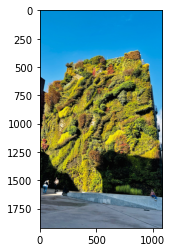

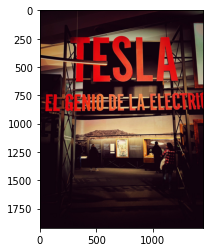

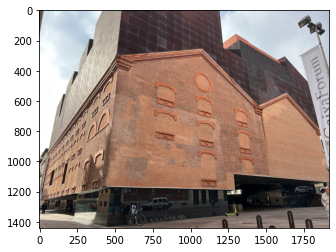

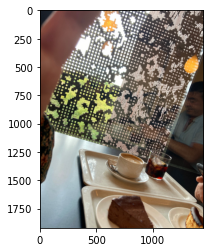

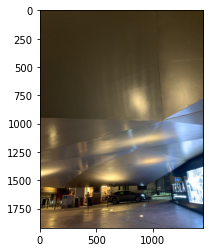

...

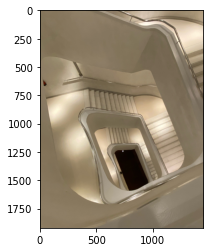

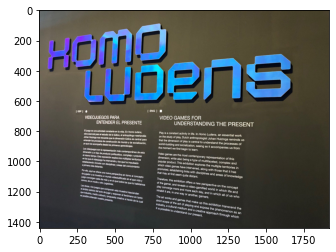

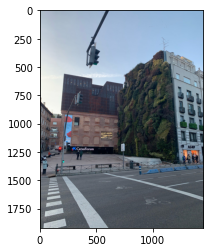

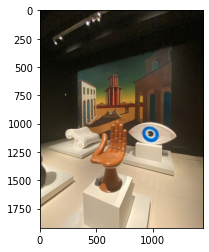

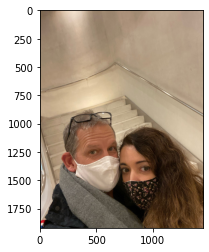

Beautiful madrid with such a great place 👍
**************************************************
Most exhibits closed,  not very disabled-friendly
**************************************************
Have not been inside this time but the wall is very cool!
**************************************************
Amazing art exhibitions
**************************************************
Must see..
**************************************************
I’m in love
**************************************************
Really cool Warhol Exhibition. Great museum, fantastic building
**************************************************
4€ entry fee is a good deal!
**************************************************
Vertical garden and great architecture.
**************************************************
visit the place, there's always an interesting exposition. Last floor has a beautiful restaurant.
**************************************************
Really nice exposition spaces here! The vertical garden is on

In [74]:
# Photos
fsq_id = "4b0015c0f964a520b43a22e3"

url_params = {"limit"           : 50,
              "sort"            : "newest",
              "classifications" : None} 

details_url = f"https://api.foursquare.com/v3/places/{fsq_id}/photos"

headers = {"accept": "application/json", 
           "Authorization": API_KEY}

response = requests.get(url = details_url, params = url_params, headers = headers)

data = response.json()

image_data = list()

for r in data:
    image_id = r["id"]
    created_at = r["created_at"]
    prefix = r["prefix"] + "original" # Hay que agregar "original" al url para poder visualizarlo.
    suffix = r["suffix"]
    
    image_data.append([image_id, prefix + suffix, created_at])
    
df_image = pd.DataFrame(data = image_data, columns = ["id", "image_url", "created_at"])

for url in df_image["image_url"]:
    
    f = urllib.request.urlopen(url)

    a = plt.imread(f, format = f".{url.split('.')[-1]}")
    plt.imshow(a)
    plt.show()
    
################################################################################

# Tips
url_params = {"limit"  : 50,
              "fields" : "id,created_at,text,lang",
              "sort"   : "newest"} 

details_url = f"https://api.foursquare.com/v3/places/{fsq_id}/tips"

headers = {"accept": "application/json", 
           "Authorization": API_KEY}

response = requests.get(url = details_url, params = url_params, headers = headers)

data = response.json()

tips_data = list()

for r in data:
    tips_id = r["id"]
    created_at = r["created_at"]
    text = r["text"]
    lang = r["lang"]
    
    tips_data.append([text, lang, created_at, tips_id])
    
df_tips = pd.DataFrame(data = tips_data, columns = ["text", "lang", "created_at", "tips_id"])

for text in df_tips["text"]:
    
    print(text)
    print("*"*50)

In [ ]:
################################################################################################################################